In [1]:
# Enable autoreload of module
%load_ext autoreload
%autoreload 2

In [2]:
import torch
from vector_quantize_pytorch import VectorQuantize
import os
from data.neural_field_datasets_shapenet import ShapeNetDataset, FlattenTransform3D, TokenTransform3D, ModelTransform3DFromTokens, ModelTransform3D
from training import training_nano_gpt
from utils.visualization3d import visualize_model3d, model_to_mesh

from networks.nano_gpt import GPTConfig

torch.cuda.is_available()

/home/luca/.cache/pypoetry/virtualenvs/adl4cv-OvNqwVNf-py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/luca/.cache/pypoetry/virtualenvs/adl4cv-OvNqwVNf-py3.10/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: luca-fanselau (adl-for-cv). Use `wandb login --relogin` to force relogin


True

In [6]:
kwargs = {
"type": "pretrained",
"fixed_label": None,
}

dir_path = os.path.dirname(os.path.abspath(os.getcwd()))
data_root = os.path.join(dir_path, "adl4cv")

# load used vector quantizer
vq_dicts = torch.load(os.path.join(data_root, "models", "vq_search_results", "vq_model_dim_1_vocab_255_batch_size_32768_threshold_ema_dead_code_0_kmean_iters_0.pth"))
vq = VectorQuantize(**vq_dicts["vq_config"])
vq.load_state_dict(vq_dicts["state_dict"])
vq.to("cuda")

VectorQuantize(
  (project_in): Identity()
  (project_out): Identity()
  (_codebook): EuclideanCodebook()
)

In [7]:
dataset = ShapeNetDataset(os.path.join(data_root, "datasets", "plane_mlp_weights"), transform=TokenTransform3D(vq))
dataset_flatten = ShapeNetDataset(os.path.join(data_root, "datasets", "plane_mlp_weights"), transform=FlattenTransform3D())
dataset_model = ShapeNetDataset(os.path.join(data_root, "datasets", "plane_mlp_weights"), transform=ModelTransform3D())
backtransform = ModelTransform3DFromTokens(vq)

In [83]:
# Load all of the files in models/vq_search_results using glob


dir_path = os.path.dirname(os.path.abspath(os.getcwd()))
data_root = os.path.join(dir_path, "adl4cv")

test_idx = 14

for root, dirs, files in os.walk('models/vq_search_results'):
    losses = []
    for file in files:
        
        if file.endswith('.pth'):
            vq_dict = torch.load(os.path.join(data_root, "models", "vq_search_results", file))
            loss = vq_dict["loss"][-1]
            losses.append(loss)

    # find min loss idx
    min_loss_idx = losses.index(min(losses))
    print(f"Found best configuration {files[min_loss_idx]} with loss {losses[min_loss_idx]} from {len(losses)} configurations")

Found best configuration vq_model_dim_17_vocab_256_batch_size_131072_threshold_ema_dead_code_1_kmean_iters_2.pth with loss 9.22839888062299e-07 from 655 configurations


In [84]:
mesh, sdf = model_to_mesh(dataset_model[0][0].cuda())
mesh.show()

DIM 1 L1 - 0.0114
DIM 17 L1 - 0.5617

In [73]:

(backtransform(dataset[0][0].cuda(), None)[0].cuda().state_dict()["layers.0.weight"] - dataset_model[0][0].cuda().state_dict()["layers.0.weight"]).abs().mean()

tensor(0.5539, device='cuda:0')

In [85]:
mesh, sdf = model_to_mesh(backtransform(dataset[0][0].cuda(), None)[0].cuda())
mesh.show()

In [7]:
model_config = {
    "out_size": 1,
    "hidden_neurons": [128, 128, 128],
    "use_leaky_relu": False,
    "input_dims": 3,
    "multires": 4,
    "include_input": True,
}

In [8]:
import torch
from networks.mlp_models import MLP3D


dict_plane = torch.load("./datasets/plane_mlp_weights/occ_1a04e3eab45ca15dd86060f189eb133_jitter_0_model_final.pth", map_location=torch.device('cpu'))

for key in dict_plane.keys():
    print(f"Dim of {key}: {dict_plane[key].size()}")

model_3D = MLP3D(**model_config)
model_3D.load_state_dict(dict_plane)

Dim of layers.0.weight: torch.Size([128, 27])
Dim of layers.0.bias: torch.Size([128])
Dim of layers.1.weight: torch.Size([128, 128])
Dim of layers.1.bias: torch.Size([128])
Dim of layers.2.weight: torch.Size([128, 128])
Dim of layers.2.bias: torch.Size([128])
Dim of layers.3.weight: torch.Size([1, 128])
Dim of layers.3.bias: torch.Size([1])


<All keys matched successfully>

In [ ]:
pos_weight


In [ ]:
tok_emb + pos_emb 

In [ ]:
(128*27 + 2*128*128 + 4 * 128 + 1)

36737

In [8]:
# Config Training
config = training_nano_gpt.Config()
config.learning_rate=3e-3
config.max_iters = 30000
config.weight_decay=0.00
config.decay_lr=True
config.lr_decay_iters=config.max_iters
config.warmup_iters=0.05*config.max_iters
config.batch_size = 64
config.gradient_accumulation_steps = 1
config.init_from = "scratch"
config.out_dir ="models/shapenet_token_transformer"
config.detailed_folder = "training_sample_5"

config.wandb_project = "shapenet_token_transformer"

config.eval_interval = 250
config.metric_interval = 250

max_len = dataset[0][0].size(0)
model_config = GPTConfig(n_embd=240, block_size=1024, n_head=12, n_layer=12, vocab_size=vq_dicts["vq_config"]["codebook_size"] + 1, dropout=0.0, max_len= max_len)


In [6]:
182%12

2

In [7]:
#early_stopping = training_nano_gpt.EarlyStopper(20)

In [8]:
"""model_config = GPTConfig(
    n_embd=120, 
    block_size=len(dataset[0][0]), 
    n_head=12, n_layer=6, 
    vocab_size=vq_dicts["vq_config"]["codebook_size"] + 1,
    dropout=0.0
    )"""

'model_config = GPTConfig(\n    n_embd=120, \n    block_size=len(dataset[0][0]), \n    n_head=12, n_layer=6, \n    vocab_size=vq_dicts["vq_config"]["codebook_size"] + 1,\n    dropout=0.0\n    )'

In [9]:
cb_size = vq_dicts["vq_config"]["codebook_size"]
token_dict = {
    "SOS": cb_size,
}


In [20]:
token_dict, cb_size

({'SOS': 234,
  '0': 235,
  '1': 236,
  '2': 237,
  '3': 238,
  '4': 239,
  '5': 240,
  '6': 241,
  '7': 242,
  '8': 243,
  '9': 244},
 245)

In [10]:
# Where to put?
# Maybe adjust dataset to be able to work with splitting data and then rewrite TokenTransform 
# to do the job combined with pytorch dataloader (get_batch == __call__ of Dataloader)

def create_split_indices(n, train_ratio=0.9):
    # Generate a random permutation of indices from 0 to n-1
    shuffled_indices = torch.randperm(n)
    # Determine the cut-off for training data
    train_size = int(train_ratio * n)
    # Split indices into training and validation sets
    train_indices = shuffled_indices[:train_size]
    val_indices = shuffled_indices[train_size:]
    return train_indices, val_indices

train_indices, val_indices = create_split_indices(len(dataset))

def get_batch_lambda(config, dataset, model_config, split):
    batch_size = config.batch_size
    

    # Select indices based on the split
    if split == 'train':
        # Randomly select batch_size indices from the train_indices
        indices = train_indices[torch.randint(0, len(train_indices), (batch_size,))]
    elif split == 'val':
        # Randomly select batch_size indices from the val_indices
        indices = val_indices[torch.randint(0, len(val_indices), (batch_size,))]
    
    
    # Initialize lists to hold the sequences and labels
    samples = []
    labels = []

    # Collect samples and labels
    for idx in indices:
        sample, label = dataset[idx]
        start_tokens = torch.Tensor([token_dict["SOS"]]).long()  # Start of sequence token
        sample = torch.cat((start_tokens, sample), dim=0)
        #start_tokens = torch.Tensor([0]).long()  # Start of sequence token
        #sample = torch.cat((start_tokens, sample + 1), dim=0)
        samples.append(sample)
        labels.append(label)

    # Prepare the sequences for model input
    max_len = samples[0].size(0)
    x = torch.zeros((batch_size, max_len - 1), dtype=torch.long)
    y = torch.zeros((batch_size, max_len - 1), dtype=torch.long)
    
    for i, sample in enumerate(samples):
        end_index = sample.size(0) - 1
        x[i, :end_index] = sample[:-1]  # Exclude the last token for x
        y[i, :end_index] = sample[1:]   # Exclude the first token for y

    idx = torch.randint(0, max_len - 1 - model_config.block_size, (batch_size,))
    x_cutted = torch.zeros((batch_size, model_config.block_size), dtype=torch.long)
    y_cutted = torch.zeros((batch_size, model_config.block_size), dtype=torch.long)

    for i, offset in enumerate(idx):
        x_cutted[i, :] = x[i, offset:offset + model_config.block_size]
        y_cutted[i, :] = y[i, offset:offset + model_config.block_size]

    # x and y have to be
    x_cutted = x_cutted.to(config.device)
    y_cutted = y_cutted.to(config.device)

    return x_cutted, y_cutted, idx

create_get_batch = lambda config, dataset, model_config: lambda split: get_batch_lambda(config, dataset, model_config, split)
get_batch = create_get_batch(config, dataset, model_config)

In [11]:
len(train_indices)*dataset[0][0].shape[0]

133722680

In [12]:
# Prepeare model parameters and train
import wandb
trained_model = training_nano_gpt.train(get_batch, config, model_config, vq, vq_dicts["vq_config"], token_dict=token_dict)


Initializing a new model from scratch
number of parameters: 4.74M
num decayed parameter tensors: 50, with 4,812,660 parameters
num non-decayed parameter tensors: 98, with 28,440 parameters
using fused AdamW: True


step 0: mnist classifier loss: 3.727780818939209, mnist accuracy: 0.140625
step 0: train loss 5.6081, val loss 5.6067
step 250: mnist classifier loss: 4.654127597808838, mnist accuracy: 0.109375
step 250: train loss 3.5970, val loss 3.6100
saving checkpoint to models/token_transformer
step 500: mnist classifier loss: 4.508016109466553, mnist accuracy: 0.078125
step 500: train loss 3.5287, val loss 3.5373
saving checkpoint to models/token_transformer
step 750: mnist classifier loss: 3.647284746170044, mnist accuracy: 0.203125
step 750: train loss 3.4239, val loss 3.4286
saving checkpoint to models/token_transformer
step 1000: mnist classifier loss: 3.3942887783050537, mnist accuracy: 0.21875
step 1000: train loss 3.3050, val loss 3.3171
saving checkpoint to models/token_transformer
step 1250: mnist classifier loss: 3.3658699989318848, mnist accuracy: 0.25
step 1250: train loss 3.1430, val loss 3.1436
saving checkpoint to models/token_transformer
step 1500: mnist classifier loss: 2.64371

In [11]:
import matplotlib.pyplot as plt
import torch
from networks.nano_gpt import GPT
from utils import get_default_device

model_dict = torch.load("./models/token_transformer/N_ALL_5M_LARGE_GOOD.pth")
# Configuration
print(model_dict.keys())
idx = 3

device = get_default_device()
model = GPT(model_dict["model_args"])#model_dict
model.to(device=device)
model.load_state_dict(model_dict["model"])
model.eval()

vq = VectorQuantize(**model_dict["vq_config"])
vq.load_state_dict(model_dict["vq_state_dict"])
vq.eval()

dataset = MnistNeFDataset(os.path.join(data_root, "datasets", "mnist-nerfs"), transform=TokenTransform(vq), **kwargs)


sample = dataset[0][0]
X, Y = get_batch('val')
X, Y = (X[0].unsqueeze(0), Y[0].unsqueeze(0))
pred, _ = model(X, Y)
# Sanity Check
# Should be all true except first/second element
pred.argmax(dim=-1)==Y


dict_keys(['model', 'optimizer', 'model_args', 'iter_num', 'best_val_loss', 'config', 'vq_state_dict', 'vq_config', 'token_dict'])
number of parameters: 5.62M


tensor([[False, False, False, False,  True,  True, False, False, False, False,
         False, False, False, False, False, False,  True, False,  True, False,
         False, False, False, False, False,  True, False,  True,  True,  True,
          True, False,  True, False, False, False, False, False, False, False,
         False, False, False, False,  True, False, False, False, False, False,
         False, False, False,  True, False, False,  True, False, False, False,
          True, False, False,  True, False, False, False,  True,  True, False,
          True, False, False,  True, False, False, False, False, False, False,
         False, False,  True, False,  True, False, False, False, False, False,
          True, False, False,  True,  True,  True, False, False, False,  True,
         False, False, False, False,  True,  True, False, False, False, False,
          True, False,  True, False, False, False,  True,  True,  True, False,
          True, False, False, False, False, False, F

tensor(238, device='cuda:0')
tensor(236, device='cuda:0')
tensor(238, device='cuda:0')
tensor(238, device='cuda:0')


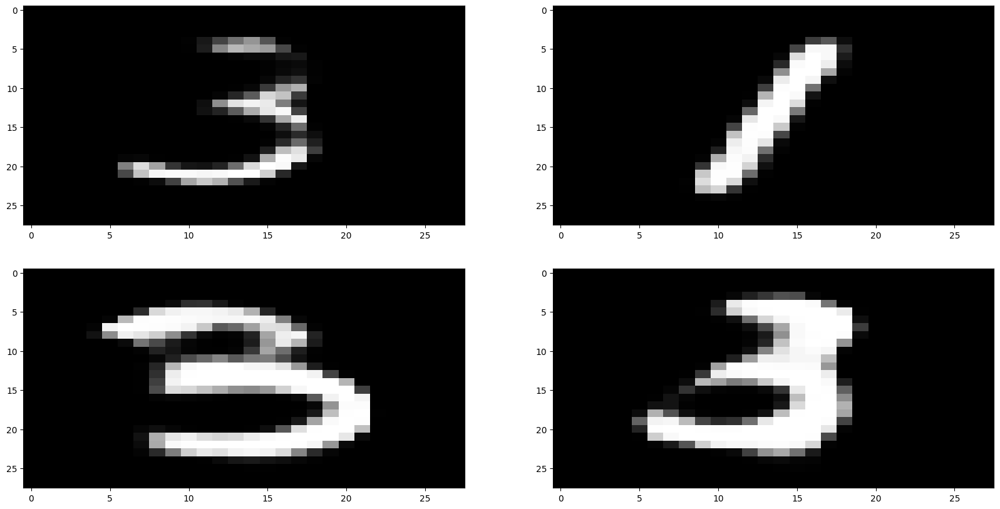

In [12]:
from animation.util import backtransform_weights, reconstruct_image
from networks.mlp_models import MLP3D

ij_len = 2
# Plotting the tensors as heatmaps in grayscale
fig, axes = plt.subplots(ij_len, ij_len, figsize=(20, 10))


kwargs = {
"type": "pretrained",
"fixed_label": None,
}

for i in range(ij_len):
    for j in range(ij_len):

        model.eval()
        novel_tokens = model.generate(torch.Tensor([[token_dict["SOS"]]]).long().to(device="cuda"), dataset[0][0].shape[0] + 1, temperature=0.8, top_k=3)[:, 1:]

        print(novel_tokens[0][0])
        novel_tokens = novel_tokens[:, 1:].unsqueeze(-1).to("cpu")
                                                                                                                         

        max_similarity = 0
        """
        for data in dataset:
            similarity = (data[0].to(device)==noxmarty/resnet-tiny-mnist
                max_similarity = similarity
        """
        #print(f"Maximum Similarity of picture (i, j) {(i, j)}: {max_similarity}")

        novel_weights= vq.get_codes_from_indices((novel_tokens))

        dataset_no_transform = MnistNeFDataset(os.path.join(data_root, "datasets", "mnist-nerfs"), **kwargs)
        original_dict = dataset_no_transform[0][0]

        reconstructed_dict = backtransform_weights(novel_weights, original_dict["state_dict"])

        mlp3d = MLP3D(**original_dict["model_config"])
        mlp3d.load_state_dict(reconstructed_dict)
        reconstructed_tensor = reconstruct_image(mlp3d)

        axes[i][j].imshow(reconstructed_tensor, cmap='gray', aspect='auto')

plt.show()

In [22]:
from training.mnist_classifier_score import compute_mnist_score
acc, loss= compute_mnist_score(model, vq, "cuda", token_dict)

print(acc)
print(loss)


0.703125
1.2872538566589355


In [24]:
# get the logits of the gpt model generation
model.eval()
logits_conditioning = model.generate_logits(torch.Tensor([[token_dict["SOS"]]]).long().to(device="cuda"))

# do a whole autoregressive proccess and get the logits for the last token
novel_tokens = model.generate(torch.Tensor([[token_dict["SOS"]]]).long().to(device="cuda"), dataset[0][0].shape[0] + 1, temperature=0.8, top_k=3)[:, :]
logits_last = model.generate_logits(novel_tokens[:, :-1])

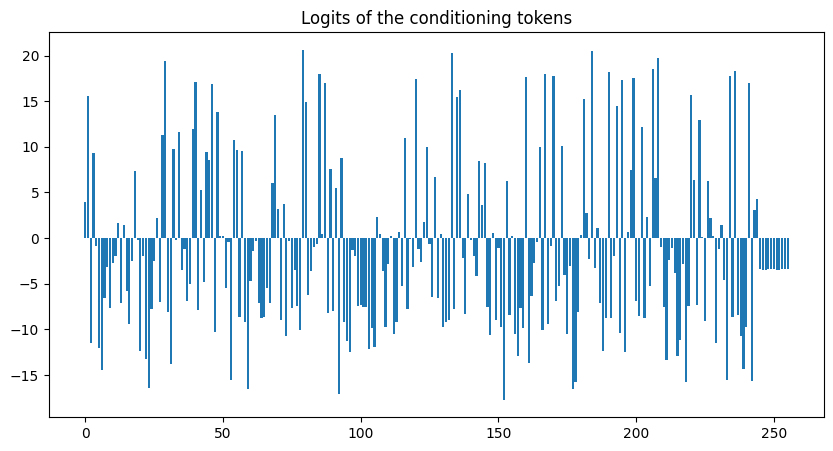

In [28]:
# barchart of the logits
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.bar(range(logits_last.shape[-1]), logits_last[0].detach().cpu().numpy())
ax.set_title("Logits of the conditioning tokens")
plt.show()

In [ ]:
logits

In [ ]:
# store the logits as numpy file
import numpy as np
np.save("logits_conditioning.npy", logits_conditioning.squeeze(0).detach().cpu().numpy())
np.save("logits_last.npy", logits_last.squeeze(0).detach().cpu().numpy())

Text(0.5, 1.0, 'Softmax of the logits of the conditioning tokens')

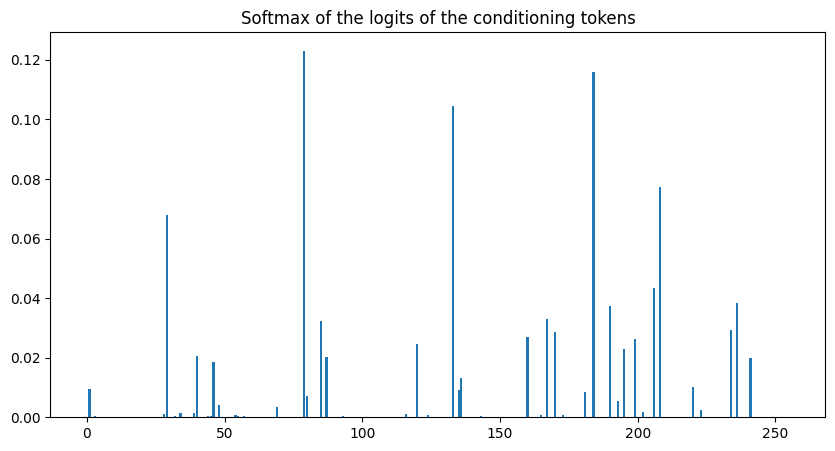

In [35]:
# softmax of the logits conditioning
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
temperature = 2
logits = logits_last / temperature
ax.bar(range(logits_last.shape[-1]), torch.softmax(logits[0], dim=-1).detach().cpu().numpy())
ax.set_title("Softmax of the logits of the conditioning tokens")

In [5]:
import optimize_metrics

optimize_metrics.main()

number of parameters: 5.62M
{'1': {'1': {'acc': 0.65625, 'loss': 1.4447228908538818}}}


{'1': {'1': {'acc': 0.65625, 'loss': 1.4447228908538818}}}